# Sprawozdanie 2
Analiza i przetwarzanie obrazów <br>
Tomasz Maczek, grupa 3 (piątek 10:30), 2022/2023, WFiIS

# Laboratorium 5

In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import math 

plt.rcParams['figure.figsize'] = [20, 10]
plt.rcParams['font.size'] = 16

**a) Proszę wczytać przykładowy obraz lab5_1.jpg i skonwertować go do obrazu w skali
szarości.**

In [2]:
image = cv2.imread("lab5_1.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

**b) Proszę sprawdzić i porównać wynik wykrywania krawędzi metodami <br>
a. Laplace <br>
b. Canny <br>
dla obrazu oryginalnego i obrazu z nałożonym filtrem gaussowskim (5x5). Wynikowy
obraz można poddać progowaniu.**

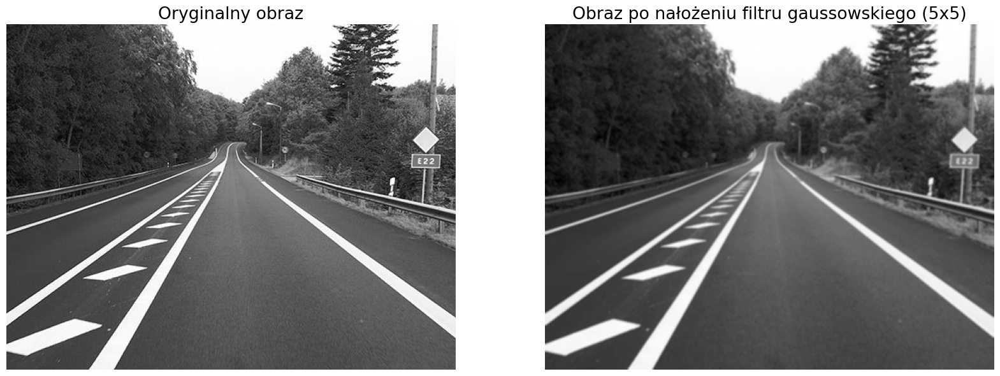

In [3]:
gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Oryginalny obraz')

plt.subplot(1, 2, 2)
plt.imshow(gaussian_blur, cmap='gray')
plt.title('Obraz po nałożeniu filtru gaussowskiego (5x5)')
plt.axis('off')
plt.show()

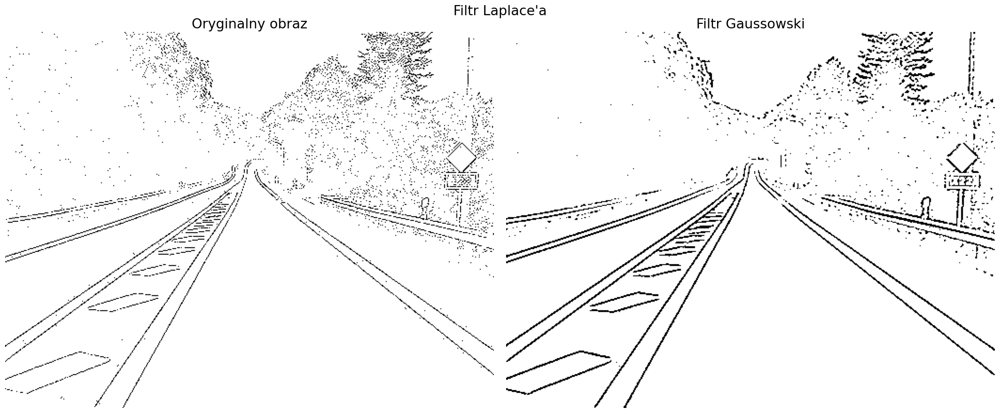

In [4]:
ddepth = 5
max_level = 255

original_laplace = cv2.Laplacian(image, ddepth=ddepth)
_, org_lap_thr = cv2.threshold(original_laplace, 100, max_level, cv2.THRESH_BINARY_INV)


gaussian_laplace = cv2.Laplacian(gaussian_blur, ddepth=ddepth)
_, gauss_lap_thr = cv2.threshold(gaussian_laplace, 15, max_level, cv2.THRESH_BINARY_INV)

plt.subplot(1, 2, 1)
plt.imshow(org_lap_thr, cmap='gray')
plt.title('Oryginalny obraz')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gauss_lap_thr, cmap='gray')
plt.title('Filtr Gaussowski')
plt.suptitle('Filtr Laplace\'a', y=0.9)
plt.axis('off')
plt.tight_layout()
plt.show()


Używany poprzednio filtr Sobela bazował na fakcie, że tam gdzie jest krawędź na obrazie zaobserwujemy skok w intensywności pikseli (*pixel intensity*). Jeśli będziemy mieli intensywność pikseli opisaną przez funkcję, krawędź będzie maksimum w pierwszej pochodnej tej funkcji. </br>

Jeśli więc weźmiemy drugą pochodną tej funkcji, krawędź powinna odpowiadać tam zeru. Używany tu operator Laplace'a jest tym samym używanym w matematyce.</br>

Należy zwrócić uwagę, że zera pojawią się również w innych miejscach niż krawędzie, jak punkty o dużej różnicy odcienia w stosunku do swojego otoczenia. Dlatego też warto jest wcześniej nałożyć na obraz filtr rozmywający (jak Gaussowski), który w takich punktach uśredni ich wartość względem otoczenia i spowoduje, że będzie mniejsza szansa wykrycia ich przez filtr krawędziowy Laplace'a. Obserwujemy to na rysunku powyżej, gdzie w porównaniu do oryginalnego obrazu, po nałożeniu filtru rozmywającego filtr krawędziowy nie wykrył jako krawędzi aż tak dużo pojedynczych punktów tam gdzie na obrazie są drzewa.



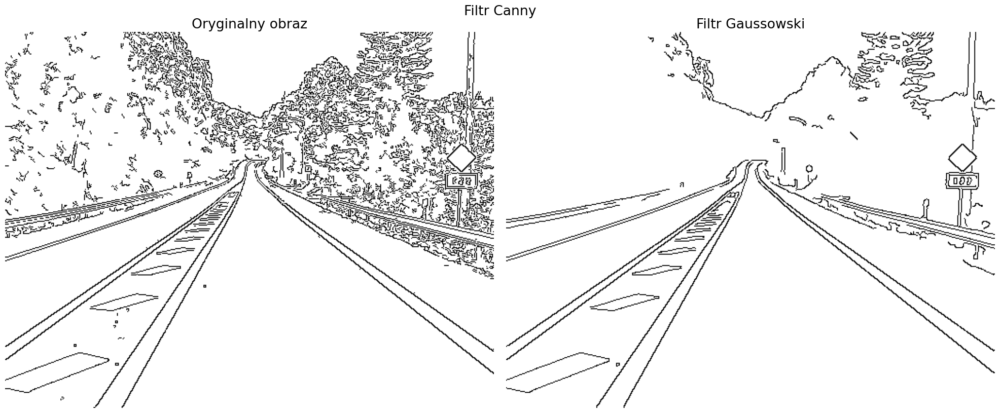

In [5]:
minVal = 100
maxVal = 200
kSize = 3

original_canny = cv2.Canny(image,minVal, maxVal)
_, org_canny_thr = cv2.threshold(original_canny, 100, max_level, cv2.THRESH_BINARY_INV)

gaussian_canny = cv2.Canny(gaussian_blur, minVal, maxVal)
_, gauss_canny_thr = cv2.threshold(gaussian_canny, 100, max_level, cv2.THRESH_BINARY_INV)

plt.subplot(1, 2, 1)
plt.imshow(org_canny_thr, cmap='gray')
plt.title('Oryginalny obraz')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(gauss_canny_thr, cmap='gray')
plt.title('Filtr Gaussowski')
plt.axis('off')
plt.suptitle('Filtr Canny', y=0.9)
plt.tight_layout()
plt.show()


Filtr Canny działa w kilku etapach:

<ol>
    <li>Redukcja szumu - w funkcji cv2.Canny używany jest do tego filtr Gaussowski 5x5 </li>
    <li>Znalezienie gradientu intesywności obrazu - wykorzystywane są do tego filtry Sobela - poziomy i pionowy, następnie dla każdego piksela znajdowany jjest gradient krawędzi oraz jego kierunek</li>
    <li> <i>Non-maximum Supression</i> - piksele są sprawdzane czy są maksimami lokalnymi aby usunąć kolejną część niechcianych elementów</li>
    <li>Progowanie - uzyskane krawędzie są poddawane progrowaniu. Wszystkie krawędzie z gradientem intensywności powyżej <b>maxVal</b> są zachowywane, wszystko poniżej <b>minVal</b> jest odrzucane. Krawędzie które są pomiędzy tymi wartościami są zachowywane tylko wtedy, kiedy istnieje część tej krawędzi powyżej wartości maxVal. W przeciwnym wypadku są odrzucane. </li>
</ol>

W porównaniu do Laplace'a widzimy, że metoda Canny przefiltrowała większość pojedynczych punktów, które nie były krawędziami.

**c) Proszę zbadać wpływ parametrów minVal, maxVal i kSize na wynik działania
algorytmu Canny.**

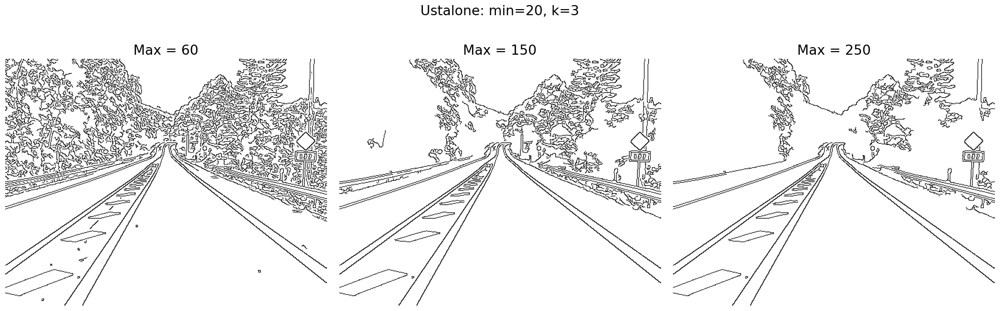

In [6]:
thresh_level = 120
max_level = 255

#Ustalone k, min -> zmiana max
k_max = 3
min_max = 20
maxes = [60, 150, 250]

max_len = len(maxes)

for i in range(max_len):
    max_max = maxes[i]
    plt.subplot(1, max_len, i + 1)
    res = cv2.Canny(gaussian_blur, min_max, max_max, k_max)
    _, res_thr = cv2.threshold(res, thresh_level, max_level, cv2.THRESH_BINARY_INV)
    plt.imshow(res_thr, cmap='gray')
    plt.axis('off')
    plt.title('Max = ' + str(max_max))

plt.tight_layout()
plt.suptitle('Ustalone: min=' + str(min_max) + ', k=' + str(k_max), y=0.85)
plt.show()


Zmiana parametru maxVal ma wpływ na to, które krawędzie będą zachowane. Wszystkie krawędzie, które nie mają choć części gradientu powyżej tej wartości są odrzucane. Obserwujemy więc wraz ze zwiększaniem tej wartości na obrazie zostają tylko 'pewniejsze' krawędzie, tracimy te mniej istotne (jak w drzewach).

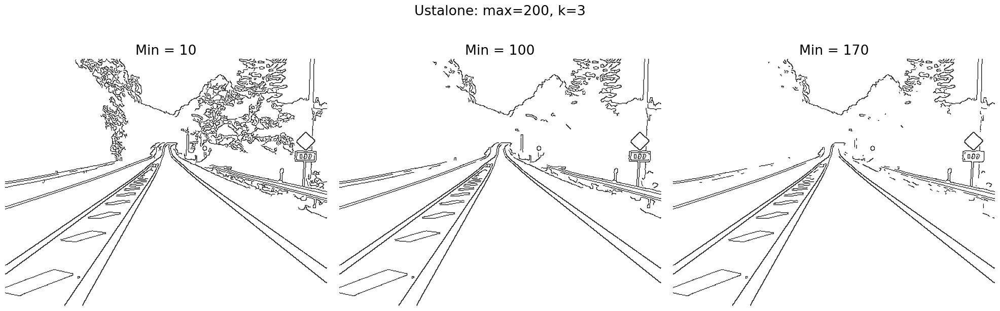

In [7]:
thresh_level = 150
max_level = 255

# ustalone k, max -> zmiana min
k_min = 3
max_min = 200
minima = [10, 100, 170]

min_len = len(minima)

for i in range(min_len):
    min_min = minima[i]
    plt.subplot(1, min_len, i + 1)
    res = cv2.Canny(gaussian_blur, min_min, max_min, k_min)
    _, res_thr = cv2.threshold(res, thresh_level, max_level, cv2.THRESH_BINARY_INV)
    plt.imshow(res_thr, cmap='gray')
    plt.axis('off')
    plt.title('Min = ' + str(min_min))

plt.tight_layout()
plt.suptitle('Ustalone: max=' + str(max_min) + ', k=' + str(k_min), y=0.85)
plt.show()

Zmiana parametru min również wpływa na to które krawędzie będą zachowane, lecz nie aż w takim stopniu jak max. Jeśli część krawędzi ma wartość gradientu intensywności powyżej ustalonego maxVal, to zmiana samego minVal nigdy nie usunie jej z wyniku. Zwiększanie tego parametru usunie tylko krawędzie, które miały w sobie bardzo rozbieżne wartości gradientu intensywności - powyżej max i poniżej min.

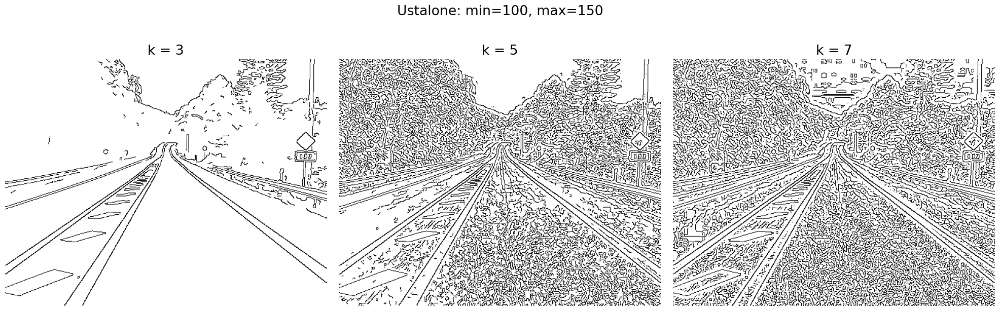

In [8]:
thresh_level = 200
max_level = 255

#ustalone min, max -> zmiana k
min_k = 100
max_k = 150
ks = [3, 5, 7]

k_len = len(ks)

for i in range(k_len):
    k_k = ks[i]
    plt.subplot(1, k_len, i + 1)
    res = cv2.Canny(gaussian_blur, min_k, max_k, apertureSize = k_k)
    _, res_thr = cv2.threshold(res, thresh_level, max_level, cv2.THRESH_BINARY_INV)
    plt.imshow(res_thr, cmap='gray')
    plt.axis('off')
    plt.title('k = ' + str(k_k))

plt.tight_layout()
plt.suptitle('Ustalone: min=' + str(min_k) + ', max=' + str(max_k), y=0.85)
plt.show()

Parametr k to rozmiar operatora Sobela nakładanego w drugim etapie działania Canny. Metoda przyjmuje wartości 3, 5, 7. Obserwujemy wraz ze zwiększaniem tego rozmiaru drobniejsze zmiany są wykrywane (co niekoniecznie jest pożądanym efektem).

**d) Proszę dokonać wykrywania linii metodą transformacji Hough**

In [9]:
def hough(image, thr):
    dst = cv2.Canny(image, 50, 200, None, 3)
    cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
    cdstP = np.copy(cdst)
    lines = cv2.HoughLines(dst, 1, np.pi / 180, thr, None, 0, 0)
    
    if lines is not None:
        for i in range(0, len(lines)):
            rho = lines[i][0][0]
            theta = lines[i][0][1]
            a = math.cos(theta)
            b = math.sin(theta)
            x0 = a * rho
            y0 = b * rho
            pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
            pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
            cv2.line(cdst, pt1, pt2, (0,255,0), 1, cv2.LINE_AA)
        
    linesP = cv2.HoughLinesP(dst, 1, np.pi / 180, thr, None, 50, 10)
    if linesP is not None:
        for i in range(0, len(linesP)):
            l = linesP[i][0]
            cv2.line(cdstP, (l[0], l[1]), (l[2], l[3]), (0,255,0), 1, cv2.LINE_AA)
            
    plt.subplot(1, 2, 1)
    plt.imshow(cdst)
    plt.axis('off')
    plt.title('HoughLines')
    plt.subplot(1, 2, 2)
    plt.imshow(cdstP)
    plt.axis('off')
    plt.title('HoughLinesP')
    plt.suptitle('Transformacja Hough, próg = ' + str(thr))
    plt.tight_layout()
    plt.show()
    

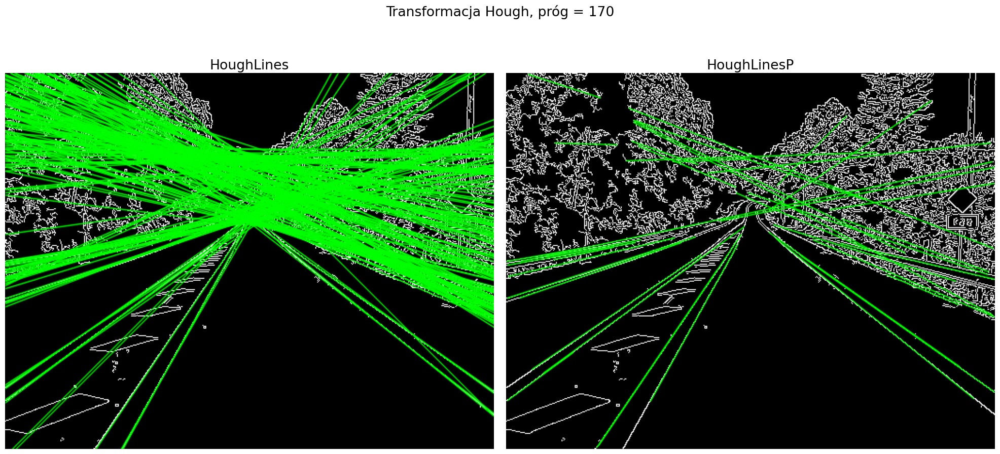

In [10]:
hough(image, 170)

Transformacja Hough działa następująco:
<ol>
    <li>Dla każdego punktu na obrazie definiowana jest rodzina linii, które przez niego przechodzą, z użyciem współrzędnych biegunowych</li>
    <li>Możemy tak dla każdego punktu stworzyć wykres zależności kąta od promienia r dla tej rodziny linii - będzie to sinusoida.</li>
    <li>Powtarzamy powyższe instrukcje dla wszystich punktów na obrazie. Jeśli krzywe dla dwóch różnych punktów przecinają się, oznacza to że punkty te leżą na tej samej prostej.</li>
    <li>Ogólnie: linia może być wykryta przez znalezienie ilości intersekcji krzywymi. Możemy zadać jako parametr minimalną ilość takich przecięć, aby można uznać linię. </li>
</ol>

Rozdzaje metody Hough w cv2:
<ul>
    <li>Standardowa - zwraca jako wynik wektor par współrzędnych biegunowych przecięć krzywych</li>
    <li>Probabilistyczna - zwraca ekstrema wykrytych linii (parę par współrzędnych kartezjańkich - mamy zatem początek i koniec linii) , jest bardziej wydajna</li>
</ul>

Przed wykonaniem tej metody zalecane jest wykonanie algorytmu detekcji krawędzi na obrazie (np. Canny).

**e) Proszę zbadać wpływ progu na wynik działania transformacji Hough**

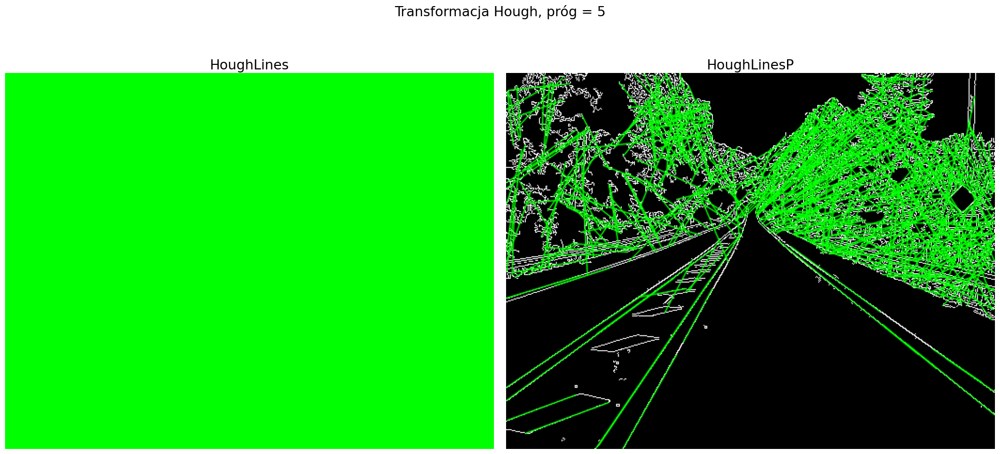

In [11]:
hough(image, thr = 5)

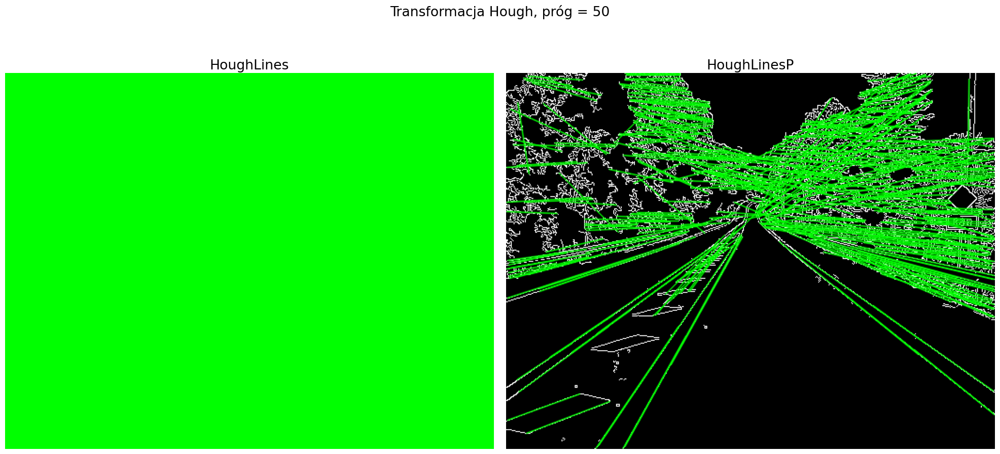

In [12]:
hough(image, thr = 50)

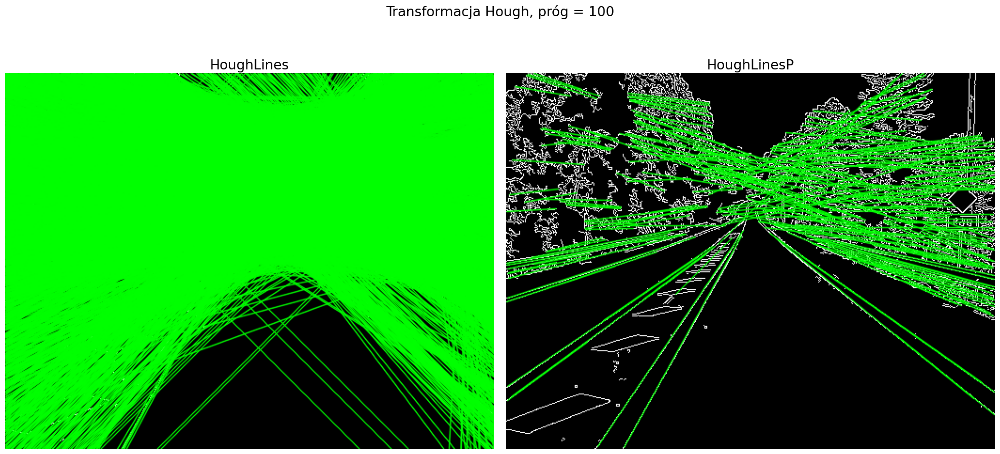

In [13]:
hough(image, thr = 100)

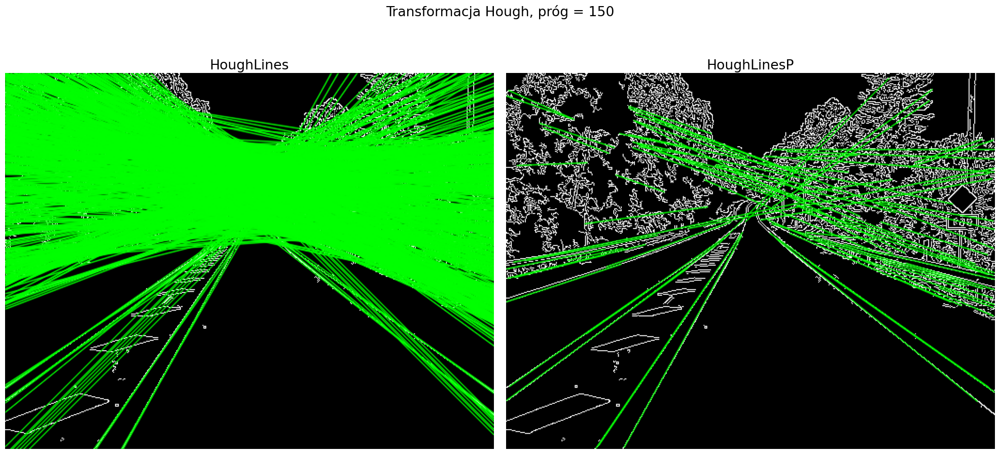

In [14]:
hough(image, thr = 150)

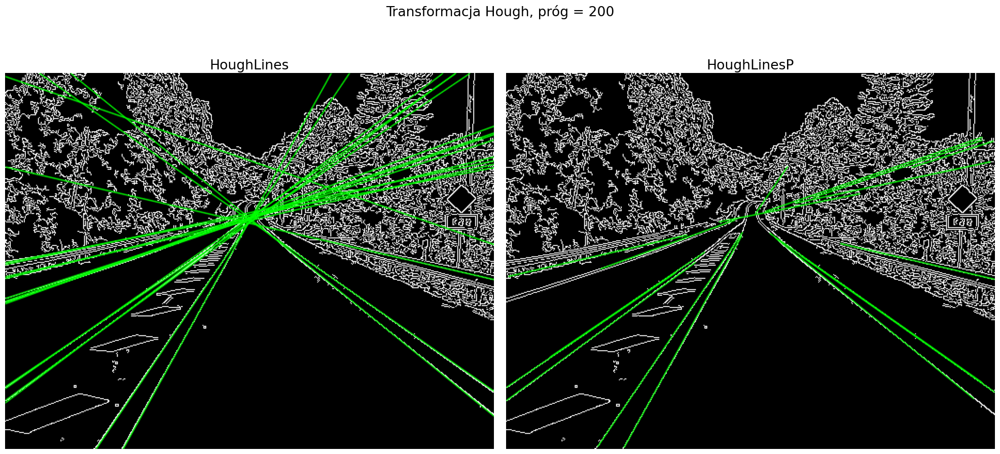

In [15]:
hough(image, thr = 200)

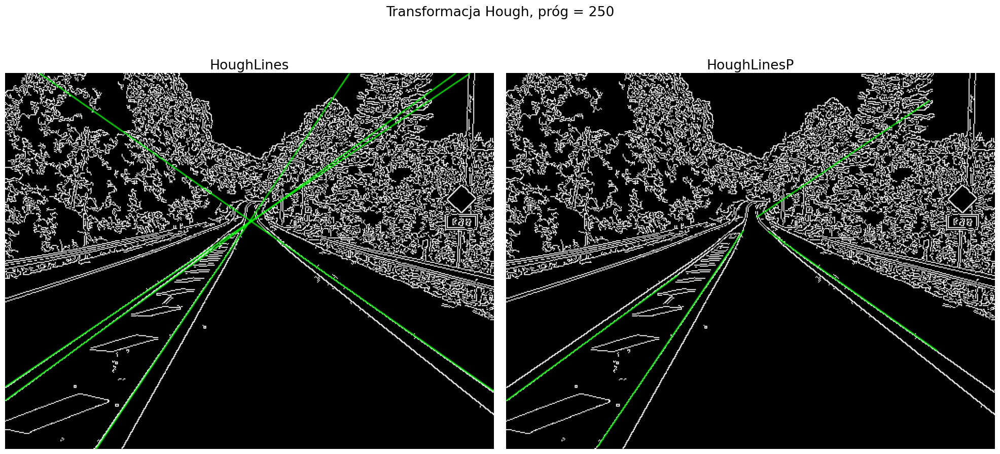

In [16]:
hough(image, thr = 250)

Wpływ doboru progu widzimy najlepiej na rysunkach z prawej strony, gdzie użyto <b>HoughLinesP</b>. Dla naszego obrazu nie otrzymujemy idealnych efektów - dla progów mniejszych od 200 linie znajdowane są wśród kawałków drzew, dla wysokiego progu 250 nie ma tego problemu, lecz tracimy wtedy część linii na asfalcie oraz przy barierkach przy drodze. Linie takie jak krawędzie znaku drogowego wymagałyby bardzo niskiego progu 5 by były widoczne, gdzie mamy już cały obszar drzew pokryty niechcianymi liniami. Jest to głównie wina specyfiki tego zdjęcia.

**f) Proszę wczytać drugi z przykładowych obrazów lab5_2.png, podobnie go skonwertować i
dokonać wykrywania okręgów**

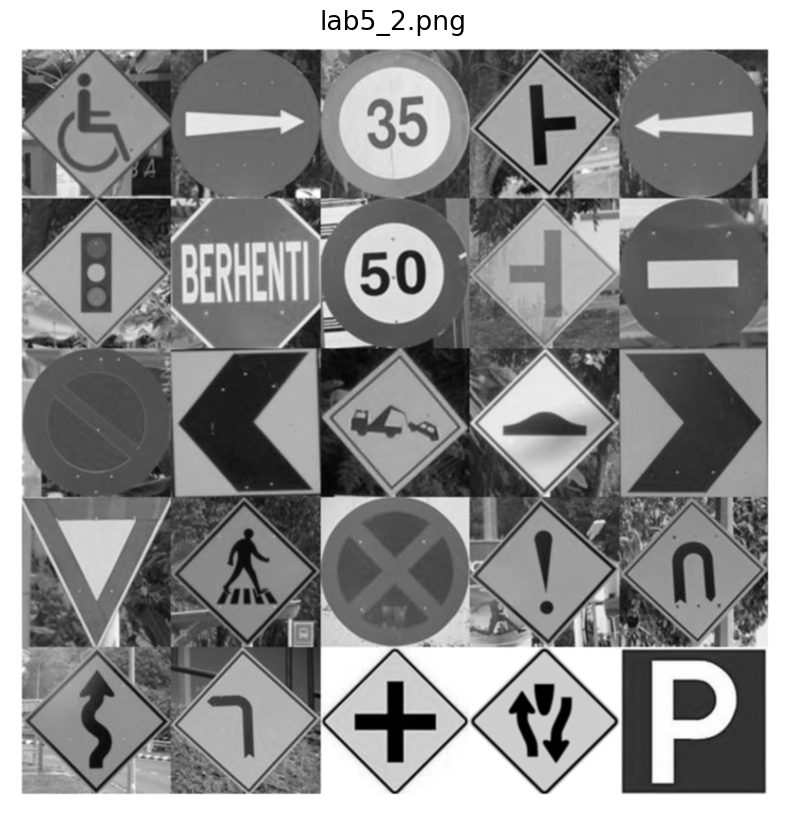

In [17]:
image2 = cv2.imread("lab5_2.png")
image2 = cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)

blur2 = cv2.GaussianBlur(image2, (5, 5), 0)

plt.imshow(blur2, cmap='gray')
plt.axis('off')
plt.title('lab5_2.png')
plt.show()

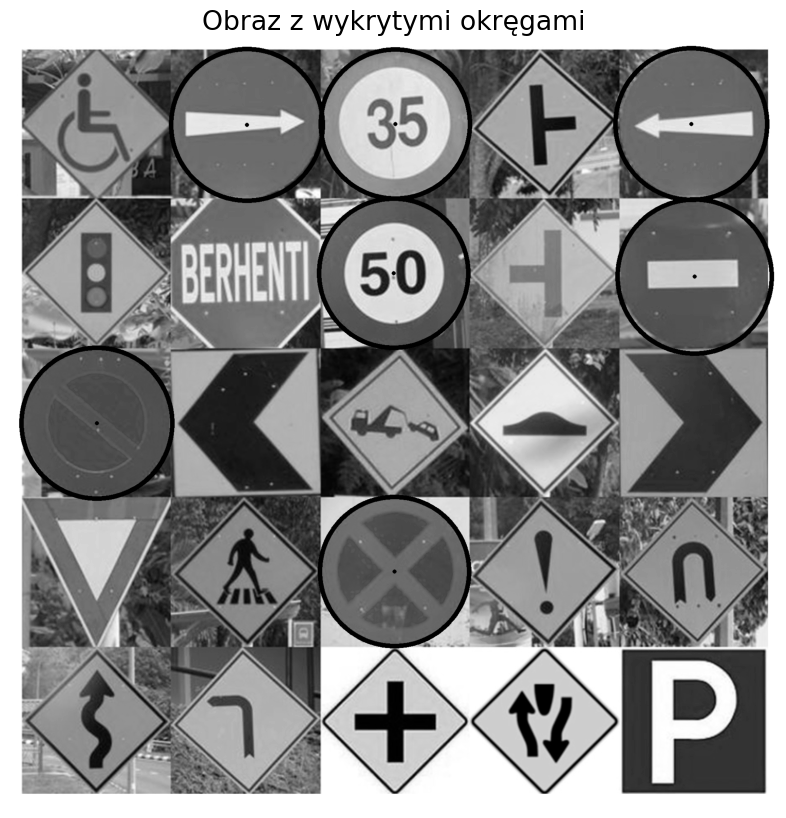

In [18]:
circles = cv2.HoughCircles(image =image2,method=cv2.HOUGH_GRADIENT,
                           dp = 1, minDist=20,
                            param1=50,param2=30,minRadius=170,maxRadius=188)

circles = np.uint16(np.around(circles))
for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(image2,(i[0],i[1]),i[2],(0,0,0),10)
    # draw the center of the circle
    cv2.circle(image2,(i[0],i[1]),2,(0,0,0),5)

plt.imshow(image2, cmap='gray')
plt.axis('off')
plt.title('Obraz z wykrytymi okręgami')
plt.show()

Metoda Hough wykrywania okręgów działa następująco:
<ul>
    <li>Wykrywamy krawędzie na obrazie</li>
    <li>Dla każdego punktu krawędziowego rysowany jest okrąg o zadanym promieniu (promieniach)</li>
    <li>W pomocniczym akumulatorze gdzie były rysowane te okręgi, tam gdzie znajdą się maksymalne skupiska linii okręgów - tam będziemy mieli środki okręgów<li>
</ul>

W cv2 **HoughCircles** przyjmowane parametry są następujące:
<ul>
    <li>image - obraz oryginalny</li>
    <li>metod - metoda detekcji</li>
    <li>dp - rozmiar akumulatora w którym rysowane będą okręgi, dla 1 - taki sam jak obraz, 2 - dwa razy mniejszy itp.</li>
    <li>minDist - minimalna odległość między środkami wykrywanych okręgów</li>
    <li>param1 - maxVal w wywoływanej metodzie Canny do wykrycia krawędzi</li>
    <li>param2 - próg akumulatora przy wykrywaniu środków okręgów</li>
    <li>minRadius, maxRadium - minimalne i maksymalne promienie</li>
</ul>

Dla tego przykładu eksperymentalnie najlepszymi minimum i maksimum promienia były odpowiednio 170 i 188. Wtedy wykryte zostały wszystkie okrągłe znaki. Dla nieco większego maksimum, jako okrąg wykywany został również ośmiokątny znak stopu (<i>BERHENTI</i>). Dla mniejszych wartości minimum okręgi zostaną wykryte nawet tam, gdzie ich nie widzimy w oryginale, dlatego dopasowanie parametrów do problemu jest niezwykle ważne.

# Laboratorium 7

**A. Proszę porównać metody Harrisa, SIFT, SURF, FAST i ORB w zadaniu rozpoznawania punktów charakterystycznych dla obrazu lab5_2.png. Dla której metody wyniki wydają się bliższe intuicji? Która wydaje się być bardziej „aplikowalna” (np. ze względu na czas obliczeń)?**

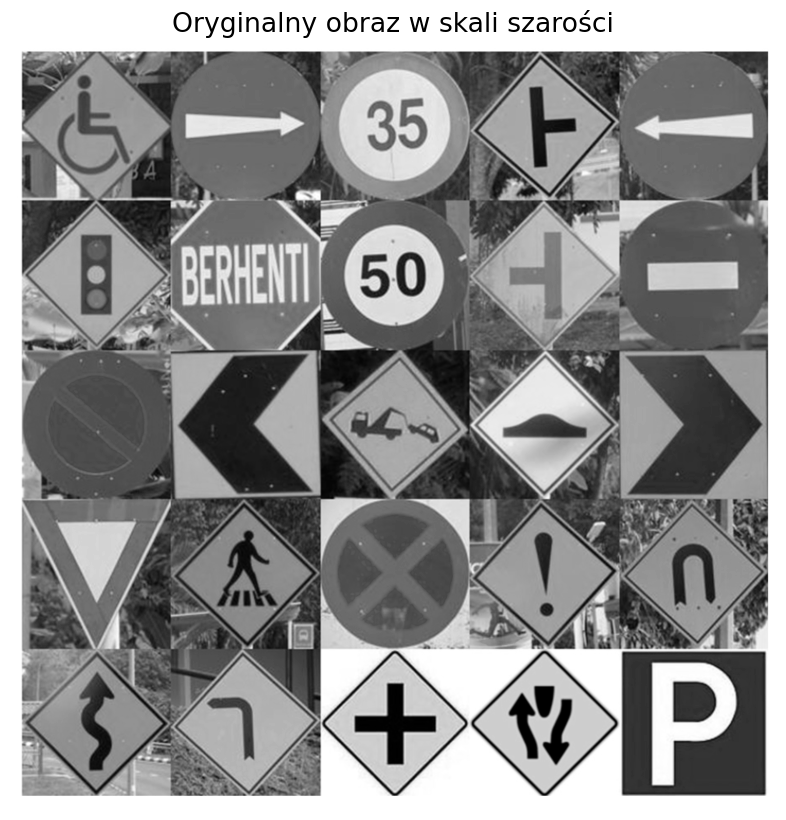

In [26]:
image = cv2.imread("lab5_2.png")
image_color = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
gaussian_blur = cv2.GaussianBlur(image, (3, 3), 0)

plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Oryginalny obraz w skali szarości')
plt.show()

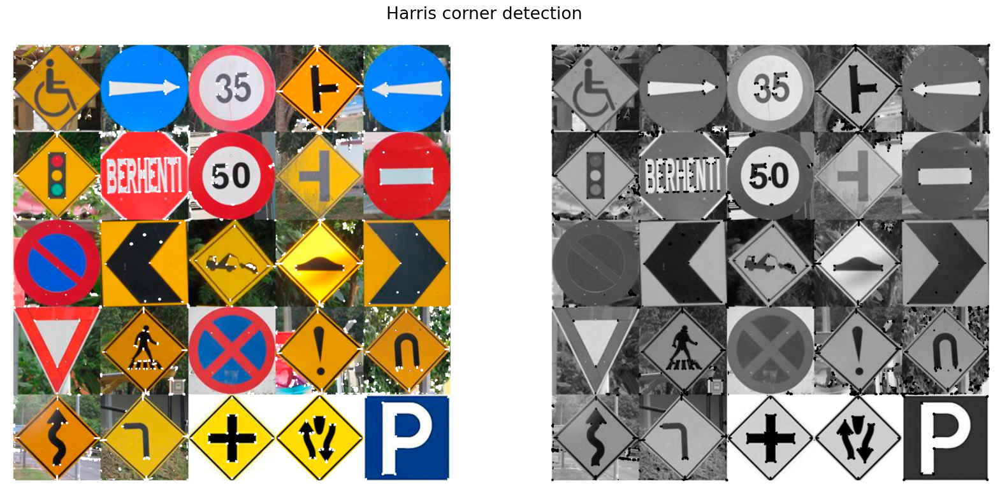

In [27]:
#harris corner detection
harris = np.float32(image)
dst = cv2.cornerHarris(gaussian_blur, 10, 5, 0.1)

dst = cv2.dilate(dst,None)

result_harris = np.copy(image)

image_color[dst>0.01*dst.max()]=[255, 255,255]
result_harris[dst>0.01*dst.max()]=[1]

plt.subplot(1, 2, 1)
plt.imshow(image_color)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(result_harris, cmap='gray')
plt.axis('off')
plt.suptitle('Harris corner detection', y=0.9)
plt.show()

Metoda Harrisa krótko opisując szuka różnicy intensywności pikseli w zadanym otoczeniu. Obiczenia bazują na wykorzystaniu filtru Sobela i policzeniu wartości własnych macierzy o wymiarze 2x2 dla każdego piksela. <br>
Wyniki są nie są tutaj idealne - część rogów nie została wykryta wcale (znaki 4ty w 2 rzędzie oraz 3ci w 4 rzędzie), na niektórych jako kąty zostały wykryte inne obiekty (w 3 rzędzie 2gi i 5ty znak).

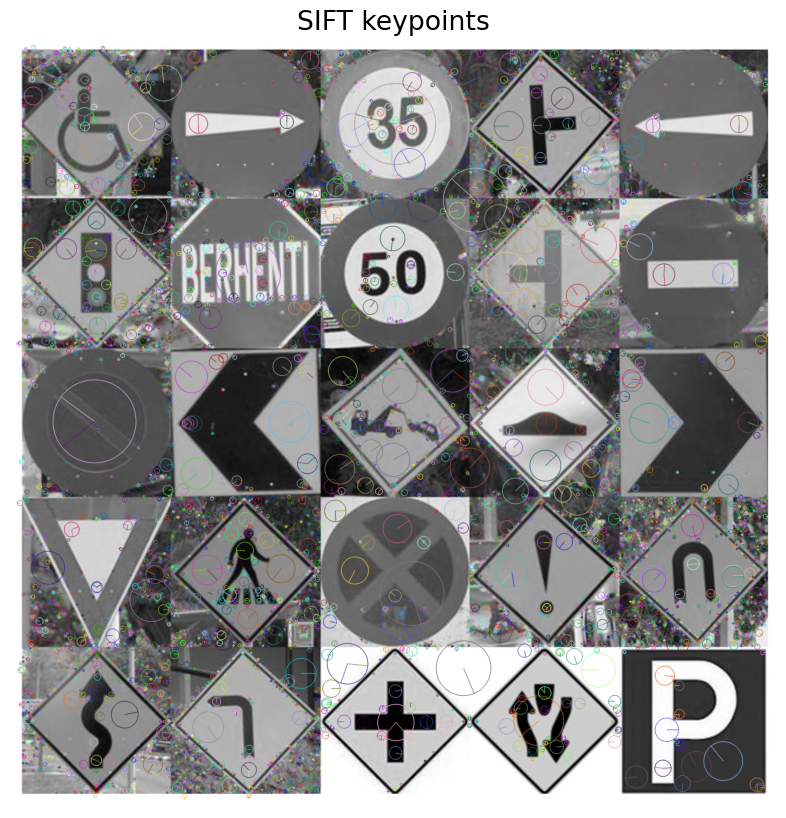

In [28]:
#sift
sift = cv2.SIFT_create()
kp = sift.detect(gaussian_blur, None)

image_color = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
result_sift = cv2.drawKeypoints(image, kp, image_color,
                               flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.imshow(result_sift)
plt.axis('off')
plt.title('SIFT keypoints')
plt.show()

SITF to algorytm działający kilkuetapowo znajdujący punkty kluczowe na obrazie. Efekty nie zależą od skali obrazu i jego orientacji. Na powyższym rysunku zaznaczone zostały wykryte keypoint'y wraz z ich kierunkiem orientacji. Można zauważyć, że w rejonach gdzie się 'więcej dzieje' znalezione zostało więcej punktów - szczególnie za znakami.

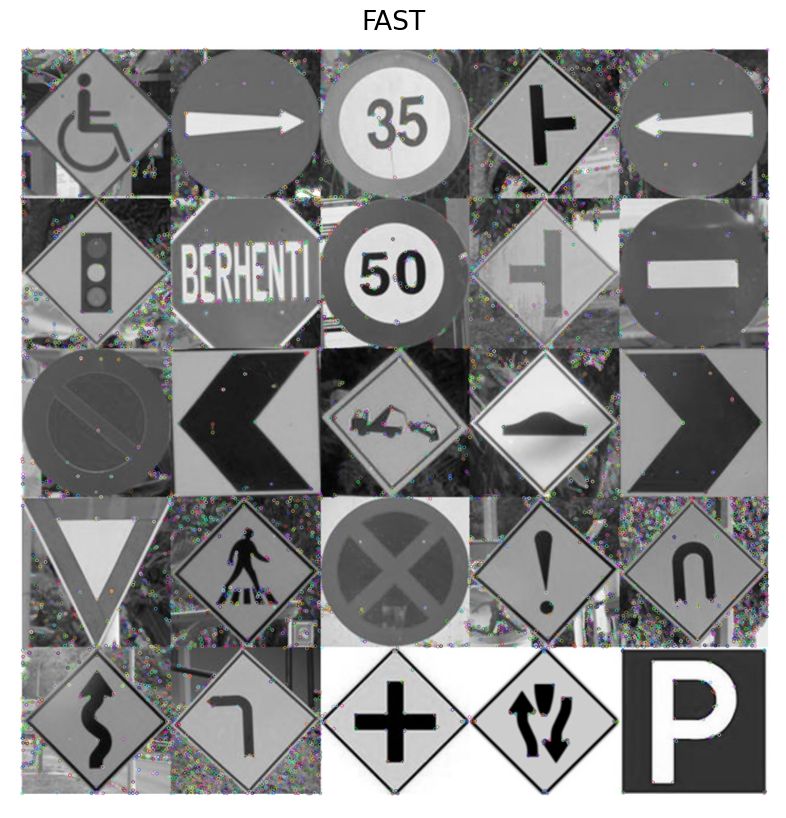

In [29]:
#fast
fast = cv2.FastFeatureDetector_create()

kp = fast.detect(gaussian_blur, None)

result_fast = cv2.drawKeypoints(image, kp, None,
                               flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.imshow(result_fast)
plt.axis('off')
plt.title('FAST')
plt.show()

W algorytmie FAST brany jest pod uwagę okrąg z 16 pikseli dookoła rozpatrywanego piksela. Punkt będzie rogiem jeśli istnieje w tym okręgu cykl **n** o intensywności większej bądź mniejszej od środkowego o zadaną wartość progu. <br>
Dla rozpatrywanego przykładu większość oczekiwanych kątów została wykryta. Wykryte zostało też sporo punktów znajdujących się na krawędziach.

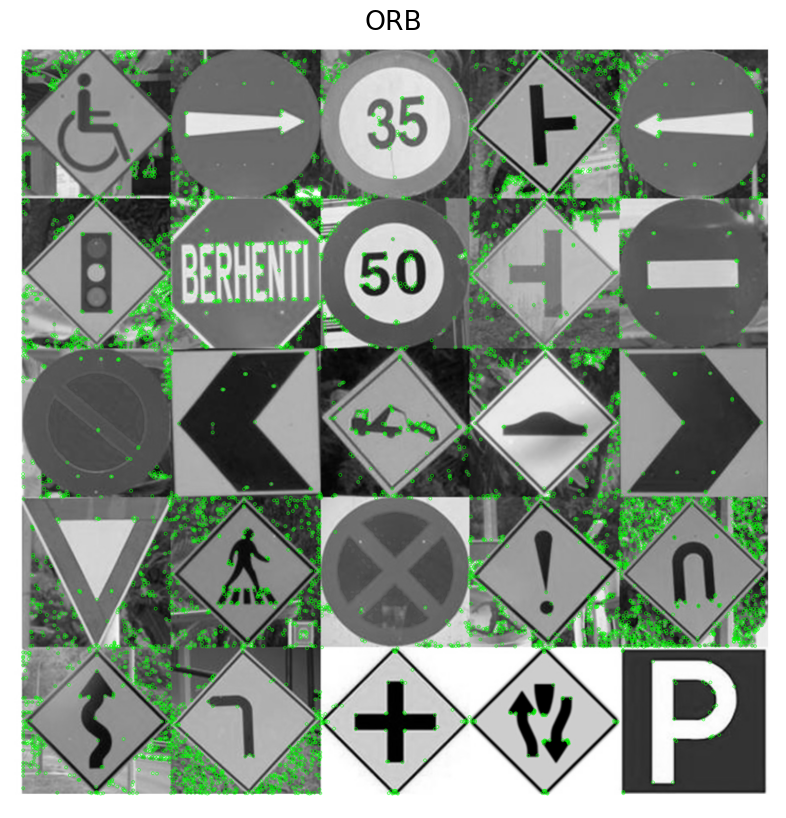

In [30]:
orb = cv2.ORB_create()

gaussian_blur = cv2.GaussianBlur(image, (3, 3), 0)

kp, des = orb.compute(gaussian_blur, kp)

img2 = cv2.drawKeypoints(image, kp, None, color=(0, 255, 0),
                         flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.imshow(img2)
plt.axis('off')
plt.title('ORB')

plt.show()

ORB jest bardziej wydajny obliczeniowo niż SIFT czy SURF, w przeciwieństwie do nich nie jest opatentowany i można go używać za darmo. Dla naszego przykładu wyniki są dość zadowalające - znalezione zostało sporo keypointów na znakach (rogi), lecz na niektóych zdjęcach widać natłok punktów charakterystycznych w tle (co może być niechciane w zależności od późniejszych operacji).

**B. Proszę spróbować wykryć twarz w sekwencji wideo – nagranej na kamerze lub ściągniętej z serwisu youtube.**

Do wykonania tego zadania wykorzystany został film z serwisu YouTube <a href="https://www.youtube.com/watch?v=96d8T_XVbq0">no vid today. my bad.</a> autorstwa Moxie Boosted. Plik zapisany jest jako **lab7.mp4**, lecz nie był dostępny na stronie prowadzącego jako przykład. Kod będzie działał poprawnie dla innych plików wideo gdzie można wykryć twarz, jednak wyniki będą opisane dla tego przypadku.<br>
Nieupubliczniona kopia wyniku znajduje się pod linkiem https://www.youtube.com/watch?v=4jkU1qm2QcU, jak również podlinkowany jest obraz z przykładami wyników.<br>
Aby **CascadeClassifier** zadział, musiałem również pobrać plik xml do swojego katalogu, dostępny on jest <a href = "https://github.com/opencv/opencv/tree/master/data/haarcascades">tutaj</a>

In [31]:
#zmienna z nazwa pliku wideo źródłowego
filename = 'lab7.mp4'

faceVid = cv2.VideoCapture(filename)

width = int(faceVid.get(3))
height = int(faceVid.get(4))

#UWAGA - w niektórych przykładach w internecie poniższa linia działa nawet bez pliku lub z użyciem cv2.data.haarclassifiers + 
#u mnie zadziałało jedynie przy pobraniu pliku xml lokalnie do katalogu
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')


In [41]:
#wczytywanie ponowne (jakby wczesniej się przeszło przez wszystkie klatki)
faceVid = cv2.VideoCapture('lab7.mp4')

fourcc = cv2.VideoWriter_fourcc(*"XVID")
out = cv2.VideoWriter("result3.mp4", fourcc=fourcc, fps=24, frameSize=(width, height))

still_frames = True

test = True
while still_frames:
    still_frames, frame = faceVid.read()
    
    if still_frames:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        positions = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=6)    
        for (x, y, w, h) in positions:
            cv2.rectangle(frame, pt1 = (x, y), pt2=(x+w, y+h), color=(0, 255, 0), thickness=3)
        out.write(frame.astype('uint8'))
        
out.release()


In [43]:
HTML("""
    <video width="200" controls autoplay>
        <source src="result3.mp4" type="video/mp4">
    </video>

""")

Wykrywanie twarzy na zdjęciach (lub filmach) metodą kaskad Haar'a polega na znajdowaniu cech charakterystycznych na zdjęciu, które występują często dla twarzy - przykładowo, linia oczu będzie ciemniejsza niż czoło, czubek nosa będzie zwykle jaśniejszy niż oczy po jego obu stronach itd. Wyniki są porównywane z wartościami wytrenowanymi na modelu i zapisanymi w pliku xml. Ponieważ nawet dla małych obrazów istnieje wielka ilość cech i ich możliwości wystąpień, algorytm został odpowiednio zoptymalizowany. Najważniejszą z optymalizacji jest koncepcja **Cascade of Classifiers** - klasifikatory są aplikowane etapami, na początku tylko kilka ogólnych, później coraz więcej znajdujących większe szczegóły. Jeśli obraz nie przejdzie przez któryś z etapów, nie musimy wykonywać następnych, co pomaga w redukcji obliczeń. <br>

Na analizowanym wideo widzimy że klasyfikator działa - twarz została wykryta przez większość filmu. Sam przykład jest nieidealny - osoba nie jest idealnie frontem twarzy do kamery i nie zawsze mamy całą twarz w kadrze, przez co mamy klatki, gdzie twarz nie została wykryta. <br>
Widzimy też, że w niektórych momentach jako twarz zostają wykrywane inne obiekty - dwa fragmenty budynku (gdzie mamy dwa okna w miejscach gdzie byśmy się spodziewali oczu na twarzy) i w jednym momencie nawet samo oko. Przy próbowaniu zmian wartości argumentów w **detectMultiScale** przy małej wartości **minNeighbors** jako twarz została wykryta nawet felga w samochodzie. <br>
Używając więc tego typu algorytmów należy więc odpowiednio dopadować typ kaskad do analizowanego wideo lub użyć ich więcej i w odpowiedniej kombinacji (np. do twarzy i oczu jednocześnie - oczy otwarte powinny znajdować się na twarzy). 

Powyżej przykład kilku klatek z wideo - na 1 i 3 widzimy poprawnie wykrytą twarz, na 2 i 5 nie została ona wykryta przez 'ucięcie' lub nieprawidłowy kąt. Na klatkach 2, 3 i 4 klatce widzimy też nieprawidłowo sklasyfikowane obiekty jako twarze.